In [1]:
import os
import random
import xml.etree.ElementTree as ET
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# === CONFIGURACIÓN ===
base_root = Path("/home/mdb/DL_Lab3/Kaggle_Dataset/")
results_csv_paths = [
   # Path("/home/mdb/reid-strong-baseline/TRANSFER_Learning_SR_ensembling/FINAL/kaggle_submission_converted_1based.csv"),
    Path("/home/mdb/reid-strong-baseline/BEST_31.57/FINAL/kaggle_submission_converted_1based_track_concat.csv"),
    Path("/home/mdb/reid-strong-baseline/TRACKS/0_25838.csv")
]


csv_labels = ["QC", "QM", "OC", "OM", "SUBM"]
query_xml = base_root / "query_label.xml"
test_xml = base_root / "test_label.xml"
query_img_dir = base_root / "image_query"
test_img_dir = base_root / "image_test"

resize_dim = (256, 128)
num_queries_to_plot = 25
top_k = 10

# === FUNCIONES ===
def parse_items(xml_path):
    tree = ET.parse(xml_path)
    return [
        {"imageName": item.attrib["imageName"]}
        for item in tree.getroot().findall("Item")
    ]

# === CARGA XMLS ===
query_items = parse_items(query_xml)
gallery_items = parse_items(test_xml)

gallery_name_to_index = {item["imageName"]: idx for idx, item in enumerate(gallery_items)}
gallery_index_to_name = {idx: item["imageName"] for idx, item in enumerate(gallery_items)}

# === CARGA TODOS LOS CSVs ===
all_dfs = []
for path in results_csv_paths:
    df = pd.read_csv(path)
    all_dfs.append(df)


# === LOOP VISUALIZACIÓN ===
query_indices = list(range(len(query_items)))
random.shuffle(query_indices)

plotted = 0

for q_count, q_idx in enumerate(query_indices):
    query = query_items[q_idx]
    query_name = query["imageName"]

    if plotted < num_queries_to_plot:
        plt.figure(figsize=(top_k * 2.5, (len(all_dfs) + 1) * 2.5))

        # Mostrar QUERY
        try:
            img = Image.open(query_img_dir / query_name).convert("RGB").resize(resize_dim)
            plt.subplot(len(all_dfs)+1, top_k+1, 1)
            plt.imshow(img)
            plt.title(f"QUERY\n{query_name}", fontsize=8)
            plt.axis("off")
        except Exception as e:
            print(f"Error cargando query {query_name}: {e}")
            continue

        # === Calcular apariciones de cada imagen en los top_k ===
        vote_counter = {}
        for df in all_dfs:
            preds = list(map(int, df.iloc[q_idx]["Corresponding Indexes"].split()))
            for gal_idx in preds[:top_k]:
                vote_counter[gal_idx] = vote_counter.get(gal_idx, 0) + 1

        # Mostrar cada CSV
        for row_idx, df in enumerate(all_dfs):
            # === Añadir primer hueco para poner el nombre del CSV ===
            plt.subplot(len(all_dfs)+1, top_k+1, (row_idx+1)*(top_k+1) + 1)
            plt.axis("off")
            plt.text(0.5, 0.5, csv_labels[row_idx], fontsize=10, ha='center', va='center')

            preds = list(map(int, df.iloc[q_idx]["Corresponding Indexes"].split()))
            for i, gal_idx in enumerate(preds[:top_k]):
                gal_name = gallery_index_to_name.get(gal_idx-1)
                if gal_name is None:
                    print(f"⚠️ Índice {gal_idx} no encontrado en galería.")
                    continue
                gal_img_path = test_img_dir / gal_name
                try:
                    gal_img = Image.open(gal_img_path).convert("RGB").resize(resize_dim)
                    plt.subplot(len(all_dfs)+1, top_k+1, (row_idx+1)*(top_k+1) + (i+2))
                    plt.imshow(gal_img)
                    plt.axis("off")

                    # Color según número de apariciones
                    count = vote_counter.get(gal_idx, 0)
                    color = 'purple'
                    if count == 2:
                        color = 'gold'
                    elif count == 3:
                        color = 'lime'

                    # Añadir nombre de imagen con color
                    plt.title(gal_name, fontsize=6, color=color)

                except Exception as e:
                    print(f"Error cargando galería {gal_name}: {e}")
                    continue

        plt.tight_layout()
        plt.show()
        plotted += 1



FileNotFoundError: [Errno 2] No such file or directory: '/home/mdb/reid-strong-baseline/TRACKS/0_25838.csv'

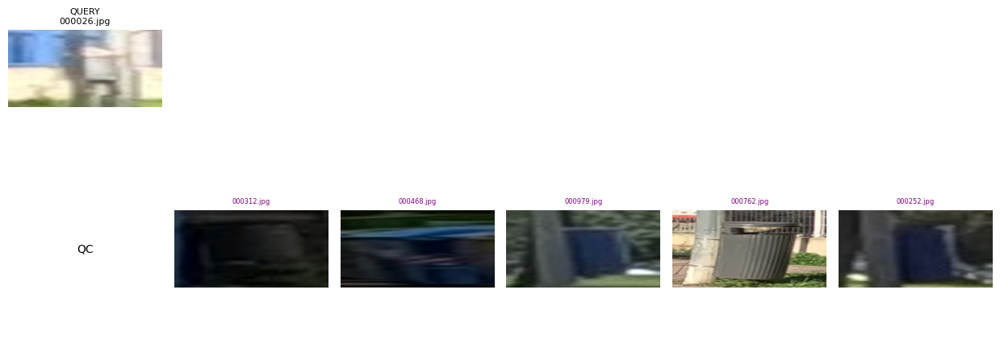

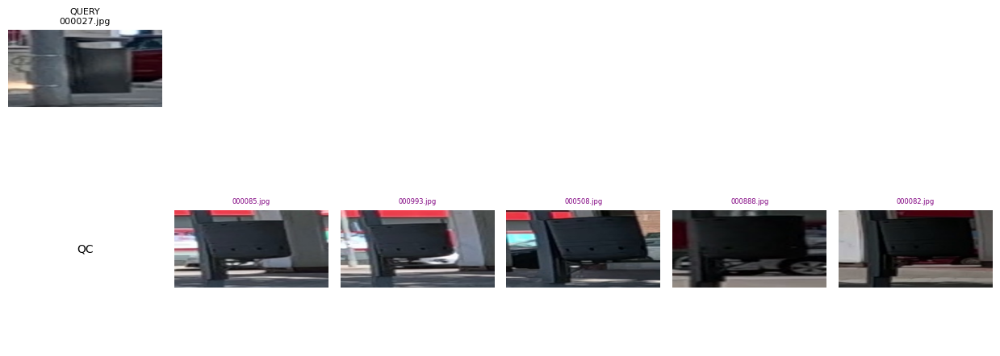

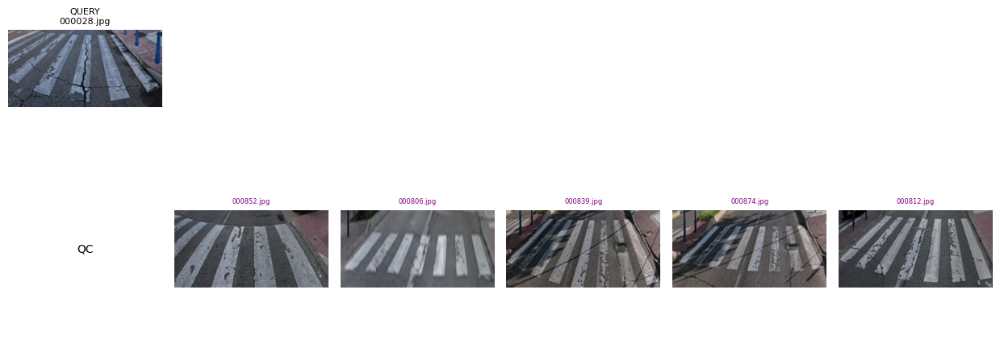

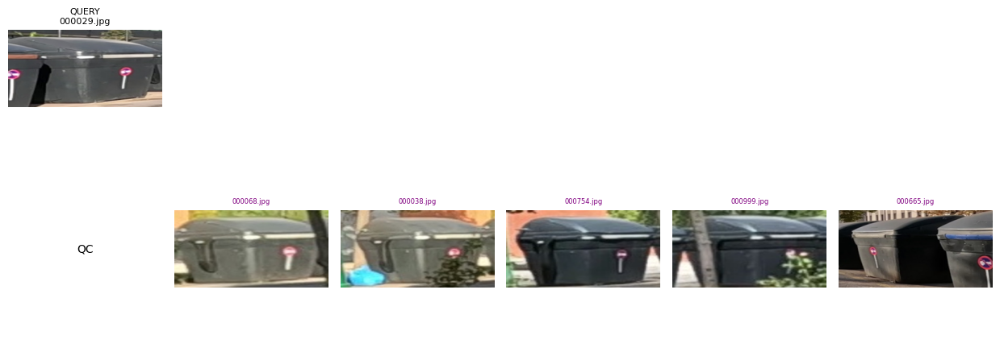

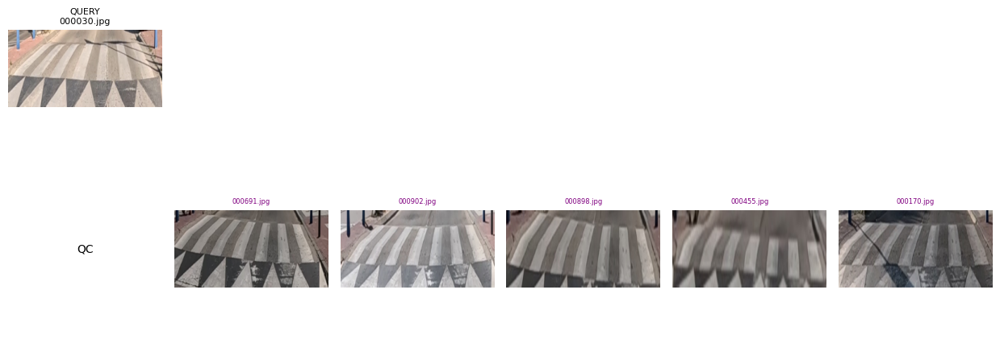

...

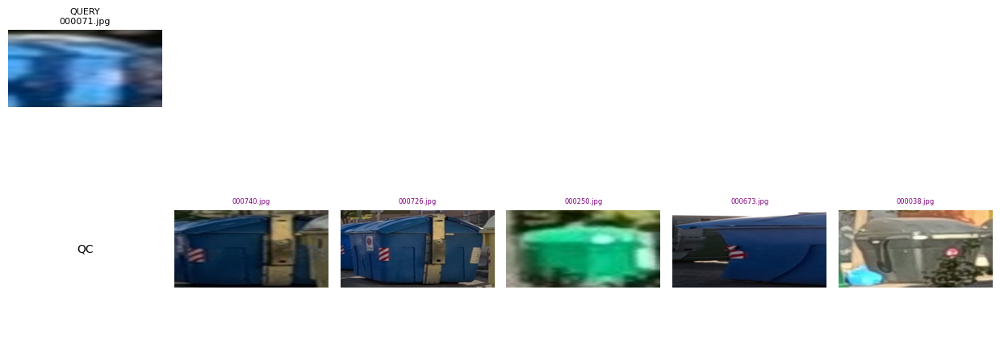

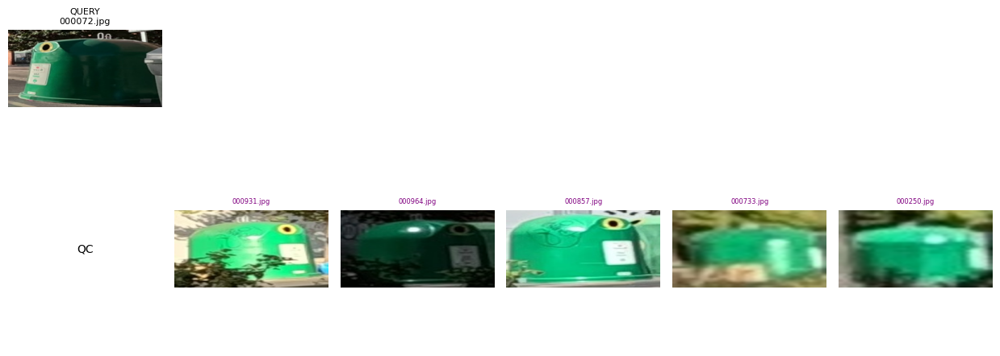

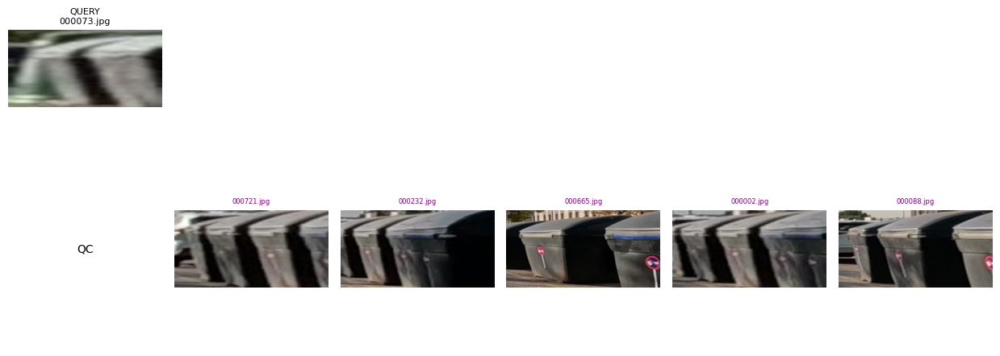

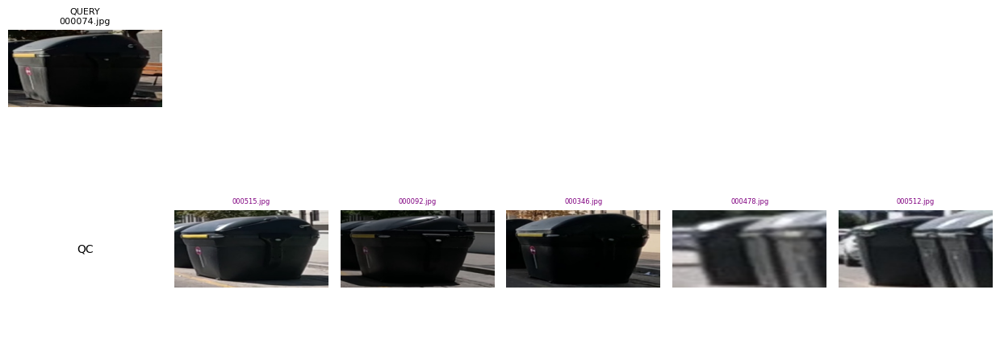

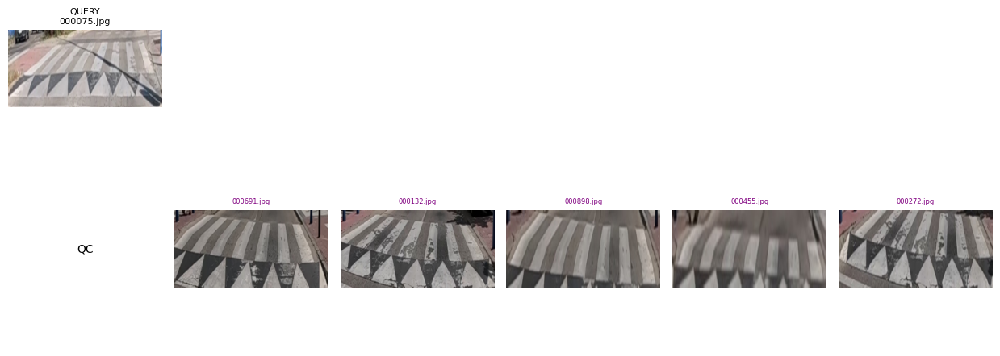

In [2]:
import os
import random
import xml.etree.ElementTree as ET
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# === CONFIGURACIÓN ===
base_root = Path("/home/mdb/DL_Lab3/Kaggle_Dataset/")
results_csv_paths = [
   # Path("/home/mdb/reid-strong-baseline/TRANSFER_Learning_SR_ensembling/FINAL/kaggle_submission_converted_1based.csv"),
    Path("/home/mdb/reid-strong-baseline/BEST_31.57/FINAL/kaggle_submission_converted_1based_track_meanCLASSIFIED.csv"),
]


csv_labels = ["QC", "QM", "OC", "OM", "SUBM"]
query_xml = base_root / "query_label.xml"
test_xml = base_root / "test_label.xml"
query_img_dir = base_root / "image_query"
test_img_dir = base_root / "image_test"

resize_dim = (256, 128)
num_queries_to_plot = 50
top_k = 5

# === FUNCIONES ===
def parse_items(xml_path):
    tree = ET.parse(xml_path)
    return [
        {"imageName": item.attrib["imageName"]}
        for item in tree.getroot().findall("Item")
    ]

# === CARGA XMLS ===
query_items = parse_items(query_xml)
gallery_items = parse_items(test_xml)

gallery_name_to_index = {item["imageName"]: idx for idx, item in enumerate(gallery_items)}
gallery_index_to_name = {idx: item["imageName"] for idx, item in enumerate(gallery_items)}

# === CARGA TODOS LOS CSVs ===
all_dfs = []
for path in results_csv_paths:
    df = pd.read_csv(path)
    all_dfs.append(df)


# === LOOP VISUALIZACIÓN ===
start_index = 25  # ← Pon aquí el valor que desees, por ejemplo: 0, 50, 100...
query_indices = list(range(start_index, start_index + 50))

plotted = 0

for q_count, q_idx in enumerate(query_indices):
    query = query_items[q_idx]
    query_name = query["imageName"]

    if plotted < num_queries_to_plot:
        plt.figure(figsize=(top_k * 2.5, (len(all_dfs) + 1) * 2.5))

        # Mostrar QUERY
        try:
            img = Image.open(query_img_dir / query_name).convert("RGB").resize(resize_dim)
            plt.subplot(len(all_dfs)+1, top_k+1, 1)
            plt.imshow(img)
            plt.title(f"QUERY\n{query_name}", fontsize=8)
            plt.axis("off")
        except Exception as e:
            print(f"Error cargando query {query_name}: {e}")
            continue

        # === Calcular apariciones de cada imagen en los top_k ===
        vote_counter = {}
        for df in all_dfs:
            preds = list(map(int, df.iloc[q_idx]["Corresponding Indexes"].split()))
            for gal_idx in preds[:top_k]:
                vote_counter[gal_idx] = vote_counter.get(gal_idx, 0) + 1

        # Mostrar cada CSV
        for row_idx, df in enumerate(all_dfs):
            # === Añadir primer hueco para poner el nombre del CSV ===
            plt.subplot(len(all_dfs)+1, top_k+1, (row_idx+1)*(top_k+1) + 1)
            plt.axis("off")
            plt.text(0.5, 0.5, csv_labels[row_idx], fontsize=10, ha='center', va='center')

            preds = list(map(int, df.iloc[q_idx]["Corresponding Indexes"].split()))
            for i, gal_idx in enumerate(preds[:top_k]):
                gal_name = gallery_index_to_name.get(gal_idx-1)
                if gal_name is None:
                    print(f"⚠️ Índice {gal_idx} no encontrado en galería.")
                    continue
                gal_img_path = test_img_dir / gal_name
                try:
                    gal_img = Image.open(gal_img_path).convert("RGB").resize(resize_dim)
                    plt.subplot(len(all_dfs)+1, top_k+1, (row_idx+1)*(top_k+1) + (i+2))
                    plt.imshow(gal_img)
                    plt.axis("off")

                    # Color según número de apariciones
                    count = vote_counter.get(gal_idx, 0)
                    color = 'purple'
                    if count == 2:
                        color = 'gold'
                    elif count == 3:
                        color = 'lime'

                    # Añadir nombre de imagen con color
                    plt.title(gal_name, fontsize=6, color=color)

                except Exception as e:
                    print(f"Error cargando galería {gal_name}: {e}")
                    continue

        plt.tight_layout()
        plt.show()
        plotted += 1
